# Video -> frames -> IR -> results

## Video -> frames

In [36]:
import cv2
import os

def extract_frames(video_path, output_dir, fps):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    cap = cv2.VideoCapture(video_path)
    frame_rate = 30
    frame_interval = int(frame_rate / fps)
    frame_count = 0
    saved_count = 0

    while cap.isOpened() :
        ret, frame = cap.read()
        if not ret:
            break

        if frame_count % frame_interval == 0:
            frame_filename = os.path.join(output_dir, f"frame_{saved_count:05d}.jpg")
            cv2.imwrite(frame_filename, frame)
            saved_count += 1

        frame_count += 1

    cap.release()

In [39]:
rgb_video_path = '/data1/jingxia3/SURA/BimodalVideo/20240612_114309_VIS_H264.MOV'
rgb_frames_dir = '/data1/jingxia3/SURA/BimodalVideo/rgb_frames'
thermal_video_path = '/data1/jingxia3/SURA/BimodalVideo/20240612_114309_IR_H264.MOV'
thermal_frames_dir = '/data1/jingxia3/SURA/BimodalVideo/thermal_frames'
fps = 5

!rm -rf /data1/jingxia3/SURA/BimodalVideo/rgb_frames
!rm -rf /data1/jingxia3/SURA/BimodalVideo/thermal_frames
extract_frames(rgb_video_path, rgb_frames_dir, fps)
extract_frames(thermal_video_path, thermal_frames_dir, fps)

In [40]:
!ls /data1/jingxia3/SURA/BimodalVideo/rgb_frames | wc
!ls /data1/jingxia3/SURA/BimodalVideo/thermal_frames | wc

    921     921   14736
    930     930   14880


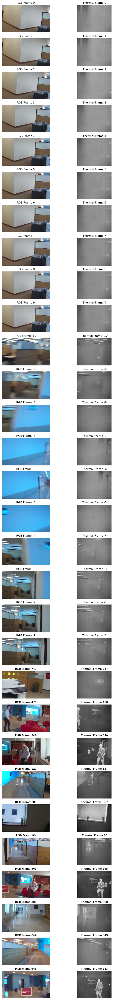

In [41]:
import os
import random
import cv2
import matplotlib.pyplot as plt

def get_frame_paths(frame_dir):
    frames = sorted([os.path.join(frame_dir, f) for f in os.listdir(frame_dir) if f.endswith('.jpg')])
    return frames

def visualize_frames(rgb_frames, thermal_frames, num_frames=10):
    # Get the first, last, and random frames
    first_frames = list(range(num_frames))
    last_frames = list(range(-num_frames, 0))
    random_frames = random.sample(range(len(rgb_frames)), num_frames)

    indices = first_frames + last_frames + random_frames

    num_rows = len(indices)
    fig, axs = plt.subplots(num_rows, 2, figsize=(10, num_rows * 2))

    for i, idx in enumerate(indices):
        rgb_frame = cv2.imread(rgb_frames[idx])
        thermal_frame = cv2.imread(thermal_frames[idx])

        rgb_frame = cv2.cvtColor(rgb_frame, cv2.COLOR_BGR2RGB)
        thermal_frame = cv2.cvtColor(thermal_frame, cv2.COLOR_BGR2RGB)

        axs[i, 0].imshow(rgb_frame)
        axs[i, 0].axis('off')
        axs[i, 0].set_title(f"RGB Frame {idx}")

        axs[i, 1].imshow(thermal_frame)
        axs[i, 1].axis('off')
        axs[i, 1].set_title(f"Thermal Frame {idx}")

    plt.tight_layout()
    plt.show()

# Paths
rgb_frames_dir = '/data1/jingxia3/SURA/BimodalVideo/rgb_frames'
thermal_frames_dir = '/data1/jingxia3/SURA/BimodalVideo/thermal_frames'

# Get frame paths
rgb_frames = get_frame_paths(rgb_frames_dir)
thermal_frames = get_frame_paths(thermal_frames_dir)

# Visualize frames
visualize_frames(rgb_frames, thermal_frames)


Doesn't seem aligned does it? I manually aligned and check the two videos on an editing software

In [55]:
rgb_video_path = '/data1/jingxia3/SURA/BimodalVideo/edited.mov'
rgb_frames_dir = '/data1/jingxia3/SURA/BimodalVideo/rgb_frames'
thermal_video_path = '/data1/jingxia3/SURA/BimodalVideo/20240612_114309_IR_H264.MOV'
thermal_frames_dir = '/data1/jingxia3/SURA/BimodalVideo/thermal_frames'
fps = 5

!rm -rf /data1/jingxia3/SURA/BimodalVideo/rgb_frames
!rm -rf /data1/jingxia3/SURA/BimodalVideo/thermal_frames
extract_frames(rgb_video_path, rgb_frames_dir, fps)
extract_frames(thermal_video_path, thermal_frames_dir, fps)

In [57]:
!ls /data1/jingxia3/SURA/BimodalVideo/rgb_frames | wc
!ls /data1/jingxia3/SURA/BimodalVideo/thermal_frames | wc

    930     930   14880
    930     930   14880


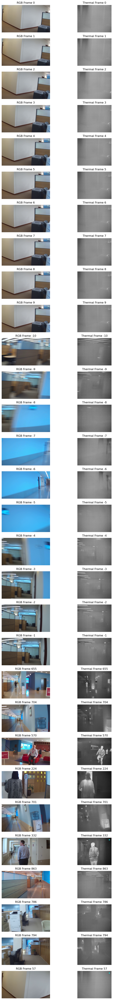

In [58]:
# Paths
rgb_frames_dir = '/data1/jingxia3/SURA/BimodalVideo/rgb_frames'
thermal_frames_dir = '/data1/jingxia3/SURA/BimodalVideo/thermal_frames'

# Get frame paths
rgb_frames = get_frame_paths(rgb_frames_dir)
thermal_frames = get_frame_paths(thermal_frames_dir)

# Visualize frames
visualize_frames(rgb_frames, thermal_frames)

yay!

## RGB frames -> RGB labels

In [59]:
# Function to perform inference on RGB images and save annotations
def generate_annotations(model, image_dir, save_dir):
    os.makedirs(save_dir, exist_ok=True)
    image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]
    print(f"Generating annotations for {len(image_files)} images")
    for image_file in image_files:
        image_path = os.path.join(image_dir, image_file)
        results = model(image_path, verbose=False, imgsz=640)
        annotation_path = os.path.join(save_dir, image_file.replace('.jpg', '.txt'))
        # Save the predicted text file to disk
        with open(annotation_path, 'w') as file:
            for i, prediction in enumerate(results[0].boxes.xywhn):
                line = f"{int(results[0].boxes.cls[i])} {prediction[0].item()} {prediction[1].item()} {prediction[2].item()} {prediction[3].item()}\n"
                file.write(line)
    print("Done!")

In [60]:
import os
import shutil
from ultralytics import YOLO

# Load the pretrained YOLOv8 model
model = YOLO('yolov8n.pt')  # or any other yolov8 model

# Paths to save RGB annotations
rgb_annotation_dir = '/data1/jingxia3/SURA/BimodalVideo/labels/'

# Generate annotations for RGB images
generate_annotations(model, rgb_frames_dir, rgb_annotation_dir)

Generating annotations for 930 images
Done!


/data1/jingxia3/SURA/BimodalVideo/rgb_frames/frame_00822.jpg
/data1/jingxia3/SURA/BimodalVideo/rgb_frames/frame_00085.jpg
/data1/jingxia3/SURA/BimodalVideo/rgb_frames/frame_00646.jpg
/data1/jingxia3/SURA/BimodalVideo/rgb_frames/frame_00195.jpg
/data1/jingxia3/SURA/BimodalVideo/rgb_frames/frame_00118.jpg
/data1/jingxia3/SURA/BimodalVideo/rgb_frames/frame_00177.jpg
/data1/jingxia3/SURA/BimodalVideo/rgb_frames/frame_00371.jpg
/data1/jingxia3/SURA/BimodalVideo/rgb_frames/frame_00593.jpg


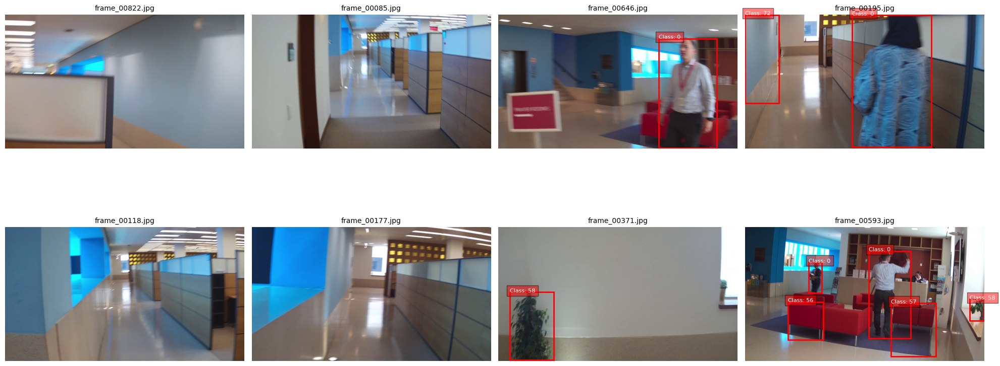

In [62]:
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

image_files = [f for f in os.listdir(rgb_frames_dir) if f.endswith('.jpg')]
selected_images = random.sample(image_files, 8)

def load_annotations(annotation_file):
    annotations = []
    with open(annotation_file, 'r') as file:
        for line in file:
            parts = line.strip().split()
            cls = int(parts[0])
            bbox = [float(p) for p in parts[1:]]
            annotations.append((cls, bbox))
    return annotations

def visualize_annotations(ax, image_path, annotations, title):
    image = Image.open(image_path)
    ax.imshow(image)
    ax.set_title(title, fontsize=10)
    for cls, bbox in annotations:
        center_x, center_y, width_n, height_n = bbox
        x_min = center_x*image.width - 0.5*width_n*image.width
        y_min = center_y*image.height - 0.5*height_n*image.height
        width = width_n*image.width
        height = height_n*image.height
        rect = patches.Rectangle((x_min, y_min), width, height, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        ax.text(x_min, y_min, f'Class: {cls}', color='white', fontsize=8, bbox=dict(facecolor='red', alpha=0.5))
    ax.axis('off')

def verify_annotations(image_dir, annotation_dir):
    fig, axs = plt.subplots(2, 4, figsize=(20, 10))
    axs = axs.flatten()

    for i, image_file in enumerate(selected_images):
        image_path = os.path.join(image_dir, image_file)
        annotation_file = os.path.join(annotation_dir, image_file.replace('.jpg', '.txt'))
        annotations = load_annotations(annotation_file)
        print(image_path)
        visualize_annotations(axs[i], image_path, annotations, image_file)
    
    plt.tight_layout()
    plt.show()
    
# Verify and visualize annotations for 8 random images
verify_annotations(rgb_frames_dir, rgb_annotation_dir)

## RGB labels -> thermal labels

/data1/jingxia3/SURA/BimodalVideo/thermal_frames/frame_00822.jpg
/data1/jingxia3/SURA/BimodalVideo/thermal_frames/frame_00085.jpg
/data1/jingxia3/SURA/BimodalVideo/thermal_frames/frame_00646.jpg
/data1/jingxia3/SURA/BimodalVideo/thermal_frames/frame_00195.jpg
/data1/jingxia3/SURA/BimodalVideo/thermal_frames/frame_00118.jpg
/data1/jingxia3/SURA/BimodalVideo/thermal_frames/frame_00177.jpg
/data1/jingxia3/SURA/BimodalVideo/thermal_frames/frame_00371.jpg
/data1/jingxia3/SURA/BimodalVideo/thermal_frames/frame_00593.jpg


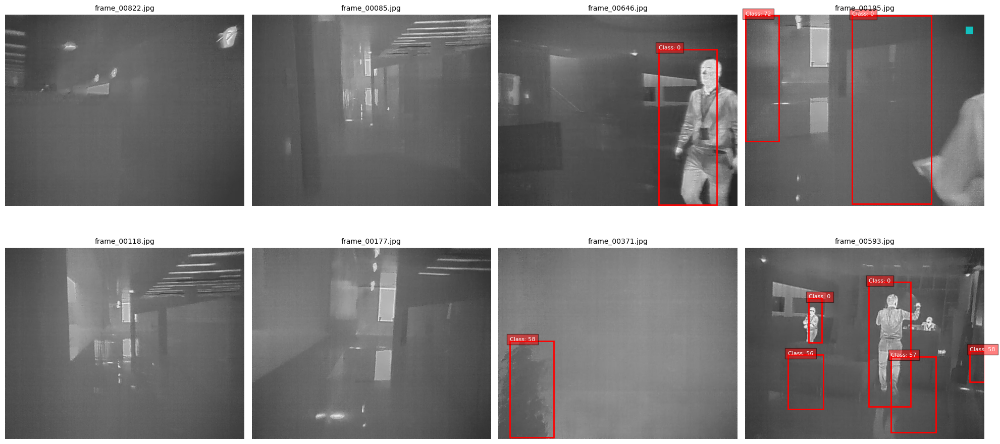

In [63]:
# Verify and visualize annotations for 8 random images
verify_annotations(thermal_frames_dir, rgb_annotation_dir)

In [66]:
import os
from PIL import Image

def process_images(input_folder, output_folder, resize_dims, crop_dims, crop_type):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    
    for filename in os.listdir(input_folder):
        if filename.endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
            img_path = os.path.join(input_folder, filename)
            img = Image.open(img_path)
            
            # Resize the image
            img_resized = img.resize(resize_dims)
            
            # Crop the image based on the crop_type
            if crop_type == 'horizontal':
                left, right = crop_dims
                img_cropped = img_resized.crop((left, 0, img_resized.width - right, img_resized.height))
            elif crop_type == 'vertical':
                top, bottom = crop_dims
                img_cropped = img_resized.crop((0, top, img_resized.width, img_resized.height - bottom))
            
            # Save the processed image
            output_path = os.path.join(output_folder, filename)
            img_cropped.save(output_path)

# Paths to your input and output folders
input_folder_1 = '/data1/jingxia3/SURA/BimodalVideo/thermal_frames'
output_folder_1 = '/data1/jingxia3/SURA/BimodalVideo/thermal_frames_cropped'
input_folder_2 = '/data1/jingxia3/SURA/BimodalVideo/rgb_frames'
output_folder_2 = '/data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped'


!rm -rf /data1/jingxia3/SURA/BimodalVideo/thermal_frames_cropped
!rm -rf /data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped

# Process thermal images
process_images(input_folder_1, output_folder_1, (1579, 1262), (91, 91), 'vertical')
# Process rgb images
process_images(input_folder_2, output_folder_2, (1920, 1080), (118, 223), 'horizontal')

In [74]:
rgb_frames_dir = '/data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped'
rgb_annotation_dir = '/data1/jingxia3/SURA/BimodalVideo/labels'
!rm -rf /data1/jingxia3/SURA/BimodalVideo/labels
generate_annotations(model, rgb_frames_dir, rgb_annotation_dir)

Generating annotations for 930 images
Done!


/data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped/frame_00822.jpg
/data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped/frame_00085.jpg
/data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped/frame_00646.jpg
/data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped/frame_00195.jpg
/data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped/frame_00118.jpg
/data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped/frame_00177.jpg
/data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped/frame_00371.jpg
/data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped/frame_00593.jpg


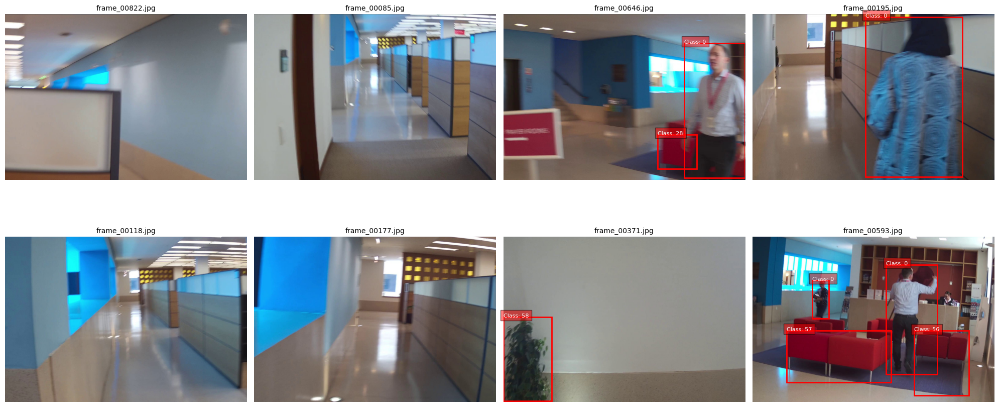

In [75]:
verify_annotations(rgb_frames_dir, rgb_annotation_dir)

/data1/jingxia3/SURA/BimodalVideo/thermal_frames_cropped/frame_00822.jpg
/data1/jingxia3/SURA/BimodalVideo/thermal_frames_cropped/frame_00085.jpg
/data1/jingxia3/SURA/BimodalVideo/thermal_frames_cropped/frame_00646.jpg
/data1/jingxia3/SURA/BimodalVideo/thermal_frames_cropped/frame_00195.jpg
/data1/jingxia3/SURA/BimodalVideo/thermal_frames_cropped/frame_00118.jpg
/data1/jingxia3/SURA/BimodalVideo/thermal_frames_cropped/frame_00177.jpg
/data1/jingxia3/SURA/BimodalVideo/thermal_frames_cropped/frame_00371.jpg
/data1/jingxia3/SURA/BimodalVideo/thermal_frames_cropped/frame_00593.jpg


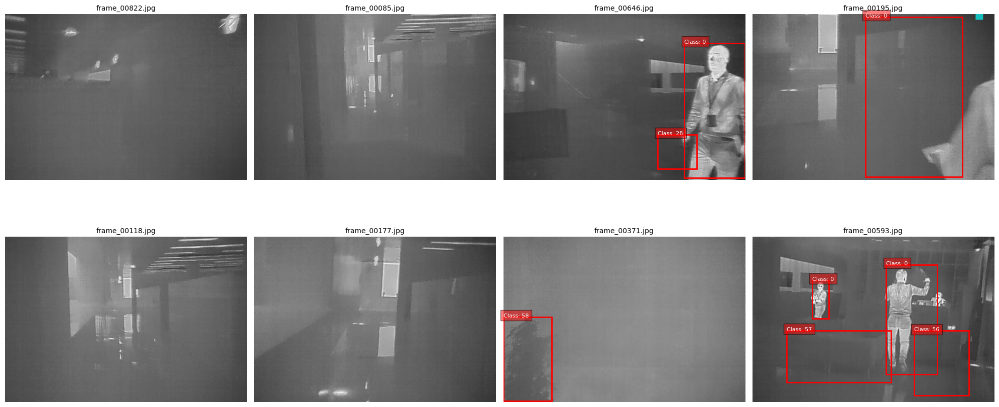

In [76]:
thermal_frames_dir = '/data1/jingxia3/SURA/BimodalVideo/thermal_frames_cropped'
verify_annotations(thermal_frames_dir, rgb_annotation_dir)

In [86]:
import os
import cv2
import numpy as np

def has_blue_square(image_path):
    image = cv2.imread(image_path)
    height, width, _ = image.shape
    
    for row in image:
        for pixel in row:
            b,g,r = pixel
            if b != g and b != r:
                return True
    return False

def filter_images(thermal_folder, rgb_folder, output_thermal_folder, output_rgb_folder, square_size=10):
    if not os.path.exists(output_thermal_folder):
        os.makedirs(output_thermal_folder)
    if not os.path.exists(output_rgb_folder):
        os.makedirs(output_rgb_folder)

    images = sorted([name for name in os.listdir(thermal_folder) if name.endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff'))])
    
    for filename in images:
        thermal_path = os.path.join(thermal_folder, filename)
        rgb_path = os.path.join(rgb_folder, filename)
        
        if has_blue_square(thermal_path):
            print(f"Removing {filename} due to blue square.")
        else:
            # Copy thermal image to output folder
            output_thermal_path = os.path.join(output_thermal_folder, filename)
            cv2.imwrite(output_thermal_path, cv2.imread(thermal_path))
            
            # Copy corresponding RGB image to output folder
            if os.path.exists(rgb_path):
                output_rgb_path = os.path.join(output_rgb_folder, filename)
                cv2.imwrite(output_rgb_path, cv2.imread(rgb_path))

# Paths to your input and output folders
thermal_folder = '/data1/jingxia3/SURA/BimodalVideo/thermal_frames'
rgb_folder = '/data1/jingxia3/SURA/BimodalVideo/rgb_frames'
output_thermal_folder = '/data1/jingxia3/SURA/BimodalVideo/thermal_frames_filtered'
output_rgb_folder = '/data1/jingxia3/SURA/BimodalVideo/rgb_frames_filtered'

# Filter images
!rm -rf /data1/jingxia3/SURA/BimodalVideo/thermal_frames_filtered
!rm -rf /data1/jingxia3/SURA/BimodalVideo/rgb_frames_filtered
filter_images(thermal_folder, rgb_folder, output_thermal_folder, output_rgb_folder)

Removing frame_00057.jpg due to blue square.
Removing frame_00058.jpg due to blue square.
Removing frame_00059.jpg due to blue square.
Removing frame_00060.jpg due to blue square.
Removing frame_00192.jpg due to blue square.
Removing frame_00193.jpg due to blue square.
Removing frame_00194.jpg due to blue square.
Removing frame_00195.jpg due to blue square.
Removing frame_00332.jpg due to blue square.
Removing frame_00333.jpg due to blue square.
Removing frame_00334.jpg due to blue square.
Removing frame_00335.jpg due to blue square.
Removing frame_00336.jpg due to blue square.
Removing frame_00477.jpg due to blue square.
Removing frame_00478.jpg due to blue square.
Removing frame_00479.jpg due to blue square.
Removing frame_00480.jpg due to blue square.
Removing frame_00481.jpg due to blue square.
Removing frame_00628.jpg due to blue square.
Removing frame_00629.jpg due to blue square.
Removing frame_00630.jpg due to blue square.
Removing frame_00631.jpg due to blue square.
Removing f

In [87]:
# Paths to your input and output folders
input_folder_1 = '/data1/jingxia3/SURA/BimodalVideo/thermal_frames_filtered'
output_folder_1 = '/data1/jingxia3/SURA/BimodalVideo/thermal_frames_cropped'
input_folder_2 = '/data1/jingxia3/SURA/BimodalVideo/rgb_frames_filtered'
output_folder_2 = '/data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped'


!rm -rf /data1/jingxia3/SURA/BimodalVideo/thermal_frames_cropped
!rm -rf /data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped

# Process thermal images
process_images(input_folder_1, output_folder_1, (1579, 1262), (91, 91), 'vertical')
# Process rgb images
process_images(input_folder_2, output_folder_2, (1920, 1080), (118, 223), 'horizontal')

In [88]:
rgb_frames_dir = '/data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped'
rgb_annotation_dir = '/data1/jingxia3/SURA/BimodalVideo/labels'
!rm -rf /data1/jingxia3/SURA/BimodalVideo/labels
generate_annotations(model, rgb_frames_dir, rgb_annotation_dir)

Generating annotations for 905 images
Done!


/data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped/frame_00439.jpg
/data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped/frame_00038.jpg
/data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped/frame_00102.jpg
/data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped/frame_00269.jpg
/data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped/frame_00574.jpg
/data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped/frame_00830.jpg
/data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped/frame_00843.jpg
/data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped/frame_00656.jpg


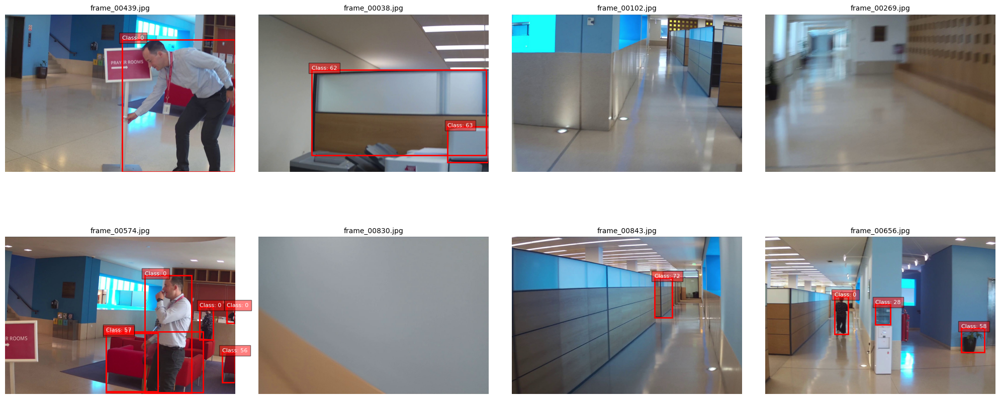

In [92]:
rgb_frames_dir = '/data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped'
image_files = [f for f in os.listdir(thermal_frames_dir) if f.endswith('.jpg')]
selected_images = random.sample(image_files, 8)
verify_annotations(rgb_frames_dir, rgb_annotation_dir)

/data1/jingxia3/SURA/BimodalVideo/thermal_frames_cropped/frame_00439.jpg
/data1/jingxia3/SURA/BimodalVideo/thermal_frames_cropped/frame_00038.jpg
/data1/jingxia3/SURA/BimodalVideo/thermal_frames_cropped/frame_00102.jpg
/data1/jingxia3/SURA/BimodalVideo/thermal_frames_cropped/frame_00269.jpg
/data1/jingxia3/SURA/BimodalVideo/thermal_frames_cropped/frame_00574.jpg
/data1/jingxia3/SURA/BimodalVideo/thermal_frames_cropped/frame_00830.jpg
/data1/jingxia3/SURA/BimodalVideo/thermal_frames_cropped/frame_00843.jpg
/data1/jingxia3/SURA/BimodalVideo/thermal_frames_cropped/frame_00656.jpg


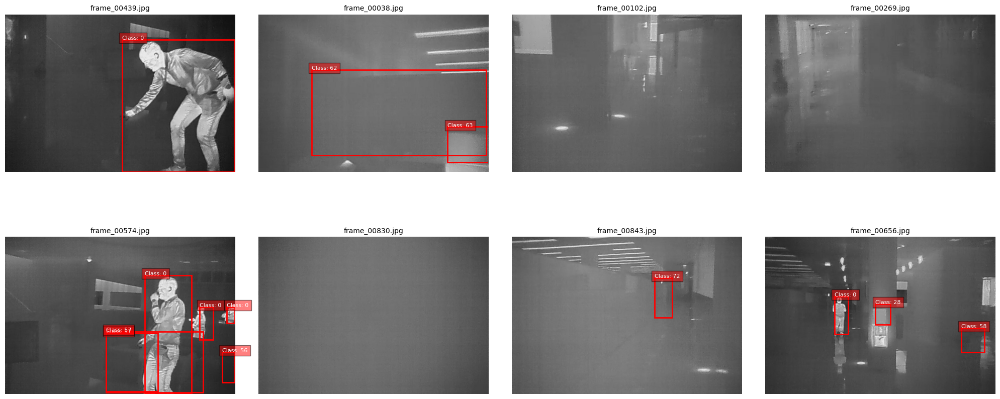

In [93]:
thermal_frames_dir = '/data1/jingxia3/SURA/BimodalVideo/thermal_frames_cropped'
verify_annotations(thermal_frames_dir, rgb_annotation_dir)

## Building dataset

In [101]:
!rm -rf /data1/jingxia3/SURA/BimodalVideo/dataset
!mkdir /data1/jingxia3/SURA/BimodalVideo/dataset

!mkdir /data1/jingxia3/SURA/BimodalVideo/dataset/train
!cp -rf /data1/jingxia3/SURA/BimodalVideo/labels /data1/jingxia3/SURA/BimodalVideo/dataset/train/
!cp -rf /data1/jingxia3/SURA/BimodalVideo/thermal_frames_cropped /data1/jingxia3/SURA/BimodalVideo/dataset/train/images

!cp -rf /data1/jingxia3/SURA/BimodalVideo/dataset/train /data1/jingxia3/SURA/BimodalVideo/dataset/test
!cp -rf /data1/jingxia3/SURA/BimodalVideo/dataset/train /data1/jingxia3/SURA/BimodalVideo/dataset/val

!cp /data1/jingxia3/SURA/FLIR/dataset/data.yaml /data1/jingxia3/SURA/BimodalVideo/dataset/

Then edited `data.yaml`

In [102]:
!rm -rf /data1/jingxia3/SURA/BimodalVideo/dataset_rgb
!mkdir /data1/jingxia3/SURA/BimodalVideo/dataset_rgb

!mkdir /data1/jingxia3/SURA/BimodalVideo/dataset_rgb/train
!cp -rf /data1/jingxia3/SURA/BimodalVideo/labels /data1/jingxia3/SURA/BimodalVideo/dataset_rgb/train/
!cp -rf /data1/jingxia3/SURA/BimodalVideo/rgb_frames_cropped /data1/jingxia3/SURA/BimodalVideo/dataset_rgb/train/images

!cp -rf /data1/jingxia3/SURA/BimodalVideo/dataset_rgb/train /data1/jingxia3/SURA/BimodalVideo/dataset_rgb/test
!cp -rf /data1/jingxia3/SURA/BimodalVideo/dataset_rgb/train /data1/jingxia3/SURA/BimodalVideo/dataset_rgb/val

!cp /data1/jingxia3/SURA/BimodalVideo/dataset/data.yaml /data1/jingxia3/SURA/BimodalVideo/dataset_rgb/

## Experimenting!

In [104]:
dataset_rgb = '/data1/jingxia3/SURA/BimodalVideo/dataset_rgb/data.yaml'

# load a model
backbone = YOLO("yolov8n.pt")

results_rgb = backbone.val(data=dataset_rgb, plots=True)

Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CUDA:0 (NVIDIA A100 80GB PCIe, 81053MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients


val: Scanning /data1/jingxia3/SURA/BimodalVideo/dataset_rgb/val/labels... 905 im

val: New cache created: /data1/jingxia3/SURA/BimodalVideo/dataset_rgb/val/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  m/data1/jingxia3/miniconda3/lib/python3.12/site-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at /opt/conda/conda-bld/pytorch_1712608847532/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.614      0.494      0.625      0.592
                person        905        570      0.984       0.96      0.993      0.967
                 train        905          7      0.899      0.714      0.807      0.774
          fire hydrant        905          2      0.814          1      0.995      0.995
                 bench        905          1          0          0     0.0343     0.0343
                   dog        905          2      0.745          1      0.995      0.995
               handbag        905          1          0          0     0.0585     0.0585
                   tie        905         17      0.635      0.614      0.684      0.599
              suitcase        905         19       0.28      0.316      0.372       0.32
                bottle        905          4      0.207       0.25      0.381      0.363
                   cup        905          5      0.386      0.263      0.495      0.495
                  bow

In [105]:
dataset_thermal = '/data1/jingxia3/SURA/BimodalVideo/dataset/data.yaml'

results_thermal = backbone.val(data=dataset_thermal, plots=True)

Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CUDA:0 (NVIDIA A100 80GB PCIe, 81053MiB)


val: Scanning /data1/jingxia3/SURA/BimodalVideo/dataset/val/labels... 905 images

val: New cache created: /data1/jingxia3/SURA/BimodalVideo/dataset/val/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.595     0.0411     0.0426     0.0219
                person        905        570      0.659      0.695       0.68      0.387
                 train        905          7          1          0      0.021     0.0179
          fire hydrant        905          2          0          0    0.00855    0.00769
                 bench        905          1          0          0          0          0
                   dog        905          2          1          0     0.0211     0.0186
               handbag        905          1          1          0          0          0
                   tie        905         17     0.0814      0.118     0.0286    0.00362
              suitcase        905         19      0.134     0.0526     0.0529     0.0136
                bottle        905          4          0          0          0          0
                   cup        905          5          0          0          0          0
                  bow

In [107]:
backbone = YOLO("yolov8n.pt")

metrics = backbone.train(data=dataset_thermal, plots=True, epochs=50)

New https://pypi.org/project/ultralytics/8.2.48 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CUDA:0 (NVIDIA A100 80GB PCIe, 81053MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/data1/jingxia3/SURA/BimodalVideo/dataset/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train17, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False

train: Scanning /data1/jingxia3/SURA/BimodalVideo/dataset/train/labels... 905 im

train: New cache created: /data1/jingxia3/SURA/BimodalVideo/dataset/train/labels.cache



val: Scanning /data1/jingxia3/SURA/BimodalVideo/dataset/val/labels.cache... 905 


Plotting labels to runs/detect/train17/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000119, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train17
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.75G      2.026      3.393       1.85         40        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.378     0.0583     0.0515     0.0262

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.72G      1.781      2.254       1.63         22        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.802     0.0901     0.0911     0.0487

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.69G      1.655      2.043      1.554         30        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986       0.72      0.137      0.125     0.0771

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50       2.7G       1.57      1.977      1.505         60        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.775       0.15      0.163     0.0997

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.69G      1.466      1.768      1.435         28        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.772      0.141      0.179      0.112

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.71G      1.432      1.733       1.41         32        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.662      0.245      0.221      0.148

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.72G      1.421      1.694      1.418         44        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986       0.72      0.186      0.237      0.156

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50       2.7G      1.365      1.583      1.353         23        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986       0.75      0.187      0.253      0.173

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.69G      1.384      1.607      1.357         32        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.722      0.222      0.255      0.175

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.69G      1.328      1.529      1.337         28        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.655      0.234      0.275       0.19

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.69G      1.331      1.539      1.342         63        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.607      0.233      0.272      0.179

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50       2.7G      1.265      1.455      1.302         35        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.553      0.308       0.28      0.191

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.72G      1.252      1.429      1.296         46        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.533       0.26      0.292      0.195

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.67G      1.285      1.442      1.313         43        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.598      0.321      0.303        0.2

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.71G      1.245      1.351       1.28         54        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986       0.54      0.344      0.315      0.213

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50       2.7G      1.202      1.367      1.268         66        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.574      0.331      0.366      0.258

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.67G      1.213      1.365      1.282         37        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.604      0.289      0.365      0.248

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.69G      1.189      1.346      1.253         42        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.554       0.34      0.358      0.246

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.73G      1.179      1.313      1.252         43        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.614      0.362      0.371      0.265

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.72G      1.184      1.295       1.25         45        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.676      0.321      0.376      0.267

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.69G      1.165      1.287      1.244         57        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.659       0.32      0.394      0.269

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.71G      1.156      1.247      1.231         67        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.738      0.298      0.394      0.284

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.72G       1.16      1.251      1.231         14        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.597      0.359      0.386      0.272

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.69G      1.132      1.216      1.212         15        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.607      0.403       0.43      0.315

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.69G      1.164      1.236      1.233         22        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986       0.63      0.392      0.422      0.306

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.69G       1.11      1.177      1.206         45        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.647      0.413      0.449      0.324

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.69G       1.12      1.196      1.223         21        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.692      0.343      0.431      0.306

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50       2.7G      1.103      1.192      1.209         32        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986        0.7      0.382      0.442      0.318

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.69G      1.092      1.175      1.197         17        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.645      0.371      0.458      0.332

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.71G      1.115      1.201      1.206         44        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.672      0.397      0.468      0.343

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.69G      1.062      1.173      1.191         30        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.653      0.424      0.469      0.348

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50       2.7G       1.08       1.18      1.194         24        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.692      0.367      0.465      0.348

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50       2.7G      1.083      1.138      1.194         56        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.716      0.388      0.484      0.368

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.69G      1.066       1.11      1.182         49        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        905       1986       0.68      0.436      0.511      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.73G      1.064      1.122      1.177         29        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        905       1986      0.728      0.382       0.52      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50       2.7G       1.05      1.118      1.179         30        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.674      0.426      0.483      0.356

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.73G      1.056      1.121      1.188         35        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.763      0.387      0.507       0.37

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.75G      1.041      1.068      1.159         45        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.697      0.441      0.497      0.371

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.69G      1.059      1.102      1.182         53        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.648      0.438      0.525      0.382

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50       2.7G      1.049      1.107      1.175         52        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.713      0.431      0.532      0.392
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.69G      1.051      1.071      1.174          5        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986       0.79      0.363      0.525      0.376

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.69G      1.016      1.027      1.172         14        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.741      0.383      0.499      0.368

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.67G       1.01      1.015      1.167         18        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.704      0.417      0.498      0.369

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50       2.7G      0.968     0.9786      1.154         17        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.723      0.418      0.517      0.377

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.69G      0.981     0.9707      1.156         15        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.701      0.439      0.537       0.39

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.69G      0.977     0.9646      1.146         20        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.751      0.433      0.556      0.404

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.69G     0.9752     0.9552       1.14         18        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.686      0.465      0.541        0.4

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.68G     0.9679     0.9643      1.142         13        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986        0.7      0.443      0.527      0.394

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.69G     0.9684     0.9601      1.145         15        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.708      0.443      0.531      0.396

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.69G     0.9667     0.9434      1.131         21        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.713      0.437      0.528      0.393

50 epochs completed in 0.099 hours.
Optimizer stripped from runs/detect/train17/weights/last.pt, 6.5MB
Optimizer stripped from runs/detect/train17/weights/best.pt, 6.5MB

Validating runs/detect/train17/weights/best.pt...
Ultralytics YOLOv8.2.23 🚀 Python-3.12.2 torch-2.3.0 CUDA:0 (NVIDIA A100 80GB PCIe, 81053MiB)
Model summary (fused): 168 layers, 3151904 parameters, 0 gradients


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        905       1986      0.755      0.429      0.554      0.402
                person        905        570      0.939      0.917       0.97      0.786
                 train        905          7      0.858      0.864       0.96       0.96
          fire hydrant        905          2      0.755          1      0.995      0.995
                 bench        905          1          1          0      0.332      0.332
                   dog        905          2       0.39        0.5      0.695      0.636
               handbag        905          1          1          0      0.497      0.199
                   tie        905         17      0.663      0.579      0.702      0.463
              suitcase        905         19      0.348      0.316      0.417      0.322
                bottle        905          4          1          0      0.249     0.0508
                   cup        905          5          1          0          0          0
                  bow